In [1]:
# Step 1: Setup and Imports
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from PIL import Image
import kagglehub
import zipfile
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [2]:
# Step 2: Download and Extract Dataset
print("Downloading dataset...")
path = kagglehub.dataset_download("birdy654/cifake-real-and-ai-generated-synthetic-images")
print(f"Dataset downloaded to: {path}")

Dataset downloaded to: /kaggle/input/cifake-real-and-ai-generated-synthetic-images


In [3]:
# Step 2: Dataset Path Setup (Simplified for Kaggle)
print("Setting up dataset path...")
extract_path = "/kaggle/input/cifake-real-and-ai-generated-synthetic-images"
print(f"Dataset location: {extract_path}")

# Verify the dataset structure
print("\nVerifying dataset structure...")
train_real_path = os.path.join(extract_path, "train", "REAL")
train_fake_path = os.path.join(extract_path, "train", "FAKE")

if os.path.exists(train_real_path):
    real_images = [f for f in os.listdir(train_real_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"✓ Train REAL folder: {len(real_images)} images")
else:
    print("✗ Train REAL folder not found")

if os.path.exists(train_fake_path):
    fake_images = [f for f in os.listdir(train_fake_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"✓ Train FAKE folder: {len(fake_images)} images")
else:
    print("✗ Train FAKE folder not found")

print("Dataset ready!")

Setting up dataset path...
Dataset location: /kaggle/input/cifake-real-and-ai-generated-synthetic-images

Verifying dataset structure...
✓ Train REAL folder: 50000 images
✓ Train FAKE folder: 50000 images
Dataset ready!


In [4]:
# Step 2: Dataset Path Setup
print("Setting up dataset path...")
extract_path = "/kaggle/input/cifake-real-and-ai-generated-synthetic-images"
print(f"Dataset location: {extract_path}")

# Check if the path exists
if not os.path.exists(extract_path):
    print(f"Error: Path {extract_path} does not exist!")
    print("Attempting to find dataset...")
    
    # Try alternative paths
    possible_paths = [
        "/kaggle/input/cifake-real-and-ai-generated-synthetic-images",
        "/kaggle/working/cifake_data",
        "./cifake_data",
        "/kaggle/input"
    ]
    
    for path in possible_paths:
        if os.path.exists(path):
            # Check if it contains our dataset structure
            if os.path.exists(os.path.join(path, "train", "REAL")):
                extract_path = path
                print(f"✓ Found dataset at: {extract_path}")
                break
    else:
        print("Dataset not found. Please check the dataset is properly attached to the notebook.")
        print("Go to: Add Data -> Search 'cifake-real-and-ai-generated-synthetic-images' -> Add")
        raise FileNotFoundError("Dataset not found in expected locations")
else:
    print("✓ Dataset path verified")

# Quick structure verification
required_folders = [
    ("train/REAL", "Train REAL images"),
    ("train/FAKE", "Train FAKE images"),
    ("test/REAL", "Test REAL images"),
    ("test/FAKE", "Test FAKE images")
]

print("\nDataset structure:")
all_good = True
for folder, description in required_folders:
    folder_path = os.path.join(extract_path, folder)
    if os.path.exists(folder_path):
        images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        print(f"  ✓ {description}: {len(images):>6} images")
    else:
        print(f"  ✗ {description}: MISSING")
        all_good = False

if all_good:
    print("\n✓ Dataset structure is correct and ready to use!")
else:
    print("\n⚠️ Some folders are missing. Check dataset structure.")

Setting up dataset path...
Dataset location: /kaggle/input/cifake-real-and-ai-generated-synthetic-images
✓ Dataset path verified

Dataset structure:
  ✓ Train REAL images:  50000 images
  ✓ Train FAKE images:  50000 images
  ✓ Test REAL images:  10000 images
  ✓ Test FAKE images:  10000 images

✓ Dataset structure is correct and ready to use!


In [5]:
# Step 3: GoogleNet Feature Extractor (From the provided notebook)
class GoogleNetFeatureExtractor(nn.Module):
    def __init__(self):
        super(GoogleNetFeatureExtractor, self).__init__()
        # Load pretrained GoogLeNet
        googlenet = models.googlenet(pretrained=True)
        
        # Remove the fully connected layers
        self.features = nn.Sequential(*list(googlenet.children())[:-2])
        
        # Add average pooling
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        
        # Freeze all layers
        for param in self.features.parameters():
            param.requires_grad = False
            
    def forward(self, x):
        features = self.features(x)
        pooled = self.avgpool(features)
        return pooled.view(pooled.size(0), -1)

In [6]:
# Step 4: Dataset Preparation
class CIFakeDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_samples=10000):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        
        # Define class folders
        class_folders = ['REAL', 'FAKE']
        
        for label, folder in enumerate(class_folders):
            folder_path = os.path.join(root_dir, 'train', folder)
            if os.path.exists(folder_path):
                images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                # Limit samples per class
                images = images[:max_samples//2]
                
                for img_name in images:
                    self.image_paths.append(os.path.join(folder_path, img_name))
                    self.labels.append(label)  # 0 for REAL, 1 for FAKE
                    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
            
        return image, label

In [7]:
# Step 4: Dataset Preparation
class CIFakeDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_samples=10000):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        
        # Define class folders
        class_folders = ['REAL', 'FAKE']
        
        for label, folder in enumerate(class_folders):
            folder_path = os.path.join(root_dir, 'train', folder)
            if os.path.exists(folder_path):
                images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                # Limit samples per class
                images = images[:max_samples//2]
                
                for img_name in images:
                    self.image_paths.append(os.path.join(folder_path, img_name))
                    self.labels.append(label)  # 0 for REAL, 1 for FAKE
                    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
            
        return image, label

In [8]:
# Step 5: Data Transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # DCGAN typically uses 64x64
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

# Load dataset
dataset = CIFakeDataset(extract_path, transform=transform, max_samples=20000)
print(f"Dataset size: {len(dataset)}")

# Split dataset
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

Dataset size: 20000
Training samples: 16000
Validation samples: 4000


In [9]:
# Step 6: Initialize GoogleNet Feature Extractor
print("Loading GoogleNet feature extractor...")
feature_extractor = GoogleNetFeatureExtractor().to(device)
feature_extractor.eval()  # Set to evaluation mode
print("GoogleNet loaded!")

Loading GoogleNet feature extractor...


Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 171MB/s]


GoogleNet loaded!


In [10]:
# Step 7: DCGAN Implementation

# A. Generator Network
class Generator(nn.Module):
    def __init__(self, latent_dim=100, feature_dim=1024):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.feature_dim = feature_dim
        
        # Initial fully connected layer
        self.fc = nn.Sequential(
            nn.Linear(latent_dim + feature_dim, 512 * 4 * 4),
            nn.BatchNorm1d(512 * 4 * 4),
            nn.ReLU(True)
        )
        
        # Transposed convolutional layers
        self.deconv = nn.Sequential(
            # Input: 512 x 4 x 4
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            
            # 256 x 8 x 8
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            # 128 x 16 x 16
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            # 64 x 32 x 32
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output: 3 x 64 x 64
        )
        
    def forward(self, z, features):
        # Concatenate noise and features
        combined = torch.cat([z, features], dim=1)
        x = self.fc(combined)
        x = x.view(-1, 512, 4, 4)
        return self.deconv(x)

# B. Discriminator Network
class Discriminator(nn.Module):
    def __init__(self, feature_dim=1024):
        super(Discriminator, self).__init__()
        
        self.conv_layers = nn.Sequential(
            # Input: 3 x 64 x 64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 64 x 32 x 32
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 128 x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            # 256 x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # Output: 512 x 4 x 4
        )
        
        # Feature processing
        self.feature_processor = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512 * 4 * 4),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        # Final classification layer
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512 * 4 * 4 * 2, 1),
            nn.Sigmoid()
        )
        
    def forward(self, img, features):
        img_features = self.conv_layers(img)
        
        # Process GoogLeNet features
        processed_features = self.feature_processor(features)
        processed_features = processed_features.view(-1, 512, 4, 4)
        
        # Combine image and GoogLeNet features
        combined = torch.cat([img_features, processed_features], dim=1)
        return self.fc(combined)

In [11]:
# Step 8: Initialize Models
latent_dim = 100
feature_dim = 1024  # GoogLeNet feature dimension

generator = Generator(latent_dim, feature_dim).to(device)
discriminator = Discriminator(feature_dim).to(device)

print("Generator Architecture:")
print(generator)
print("\nDiscriminator Architecture:")
print(discriminator)

Generator Architecture:
Generator(
  (fc): Sequential(
    (0): Linear(in_features=1124, out_features=8192, bias=True)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (deconv): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=

In [12]:
# Step 9: Loss Function and Optimizers
criterion = nn.BCELoss()

# Optimizers with recommended settings
lr = 0.0002
beta1 = 0.5

optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# Step 10: Helper Functions

def generate_noise(batch_size, latent_dim):
    """Generate random noise for generator"""
    return torch.randn(batch_size, latent_dim, device=device)

def generate_features(batch_size, feature_extractor, real_images):
    """Extract features from real images using GoogleNet"""
    with torch.no_grad():
        features = feature_extractor(real_images)
    return features

def visualize_generated_images(generator, feature_extractor, epoch, n_samples=25):
    """Generate and save sample images"""
    generator.eval()
    with torch.no_grad():
        # Get sample real images for feature extraction
        real_samples, _ = next(iter(val_loader))
        real_samples = real_samples[:n_samples].to(device)
        
        # Extract features
        features = generate_features(n_samples, feature_extractor, real_samples)
        
        # Generate noise
        noise = generate_noise(n_samples, latent_dim)
        
        # Generate images
        fake_images = generator(noise, features).detach().cpu()
        
        # Denormalize
        fake_images = fake_images * 0.5 + 0.5
        
        # Create grid
        grid = make_grid(fake_images, nrow=5, padding=2, normalize=False)
        
        # Plot
        plt.figure(figsize=(10, 10))
        plt.imshow(grid.permute(1, 2, 0).numpy())
        plt.axis('off')
        plt.title(f'Generated Images - Epoch {epoch}')
        plt.savefig(f'generated_images_epoch_{epoch}.png')
        plt.show()
    
    generator.train()

In [14]:
# Step 11: Training Function with "Bag of Tricks"
def train_gan(epochs, feature_extractor, generator, discriminator, 
              train_loader, val_loader, device, print_every=50):
    
    # Lists to track losses
    G_losses = []
    D_losses = []
    
    for epoch in range(epochs):
        for i, (real_images, labels) in enumerate(train_loader):
            batch_size = real_images.size(0)
            
            # Move to device
            real_images = real_images.to(device)
            
            # --- TRICK 1: Label Smoothing ---
            real_labels = torch.full((batch_size, 1), 0.9, device=device)  # Smooth real labels
            fake_labels = torch.full((batch_size, 1), 0.1, device=device)  # Smooth fake labels
            
            # --- TRICK 2: Feature Extraction ---
            with torch.no_grad():
                features = feature_extractor(real_images)
            
            # ==============================
            # Train Discriminator
            # ==============================
            discriminator.zero_grad()
            
            # Train with real images
            output_real = discriminator(real_images, features)
            loss_D_real = criterion(output_real, real_labels)
            
            # Train with fake images
            noise = generate_noise(batch_size, latent_dim)
            fake_images = generator(noise, features)
            output_fake = discriminator(fake_images.detach(), features)
            loss_D_fake = criterion(output_fake, fake_labels)
            
            # Total discriminator loss
            loss_D = (loss_D_real + loss_D_fake) / 2
            loss_D.backward()
            optimizer_D.step()
            
            # ==============================
            # Train Generator
            # ==============================
            generator.zero_grad()
            
            # Generate new fake images
            noise = generate_noise(batch_size, latent_dim)
            fake_images = generator(noise, features)
            
            # Try to fool the discriminator
            output = discriminator(fake_images, features)
            loss_G = criterion(output, real_labels)  # Generator wants discriminator to think fakes are real
            
            loss_G.backward()
            optimizer_G.step()
            
            # Save losses
            G_losses.append(loss_G.item())
            D_losses.append(loss_D.item())
            
            # Print progress
            if i % print_every == 0:
                print(f'Epoch [{epoch+1}/{epochs}] Batch [{i}/{len(train_loader)}] '
                      f'Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}')
        
        # Generate sample images at end of each epoch
        if (epoch + 1) % 5 == 0:
            visualize_generated_images(generator, feature_extractor, epoch + 1)
        
        # Print epoch summary
        print(f'Epoch {epoch+1} completed!')
        print(f'Average D Loss: {np.mean(D_losses[-len(train_loader):]):.4f}')
        print(f'Average G Loss: {np.mean(G_losses[-len(train_loader):]):.4f}')
    
    return G_losses, D_losses

In [15]:
# Step 12: Training Parameters
num_epochs = 50

print("Starting Training...")
print("="*50)

Starting Training...


Epoch [1/50] Batch [0/125] Loss_D: 0.7062 Loss_G: 1.6158
Epoch [1/50] Batch [100/125] Loss_D: 0.3988 Loss_G: 1.9761
Epoch 1 completed!
Average D Loss: 0.4891
Average G Loss: 2.6006
Epoch [2/50] Batch [0/125] Loss_D: 0.4372 Loss_G: 3.7995
Epoch [2/50] Batch [100/125] Loss_D: 0.4189 Loss_G: 1.9121
Epoch 2 completed!
Average D Loss: 0.5236
Average G Loss: 2.0066
Epoch [3/50] Batch [0/125] Loss_D: 0.4406 Loss_G: 2.5417
Epoch [3/50] Batch [100/125] Loss_D: 0.5168 Loss_G: 1.6306
Epoch 3 completed!
Average D Loss: 0.5368
Average G Loss: 1.8374
Epoch [4/50] Batch [0/125] Loss_D: 0.5077 Loss_G: 1.8013
Epoch [4/50] Batch [100/125] Loss_D: 0.5220 Loss_G: 2.4195
Epoch 4 completed!
Average D Loss: 0.5329
Average G Loss: 1.8475
Epoch [5/50] Batch [0/125] Loss_D: 0.5482 Loss_G: 1.4199
Epoch [5/50] Batch [100/125] Loss_D: 0.5982 Loss_G: 1.3657


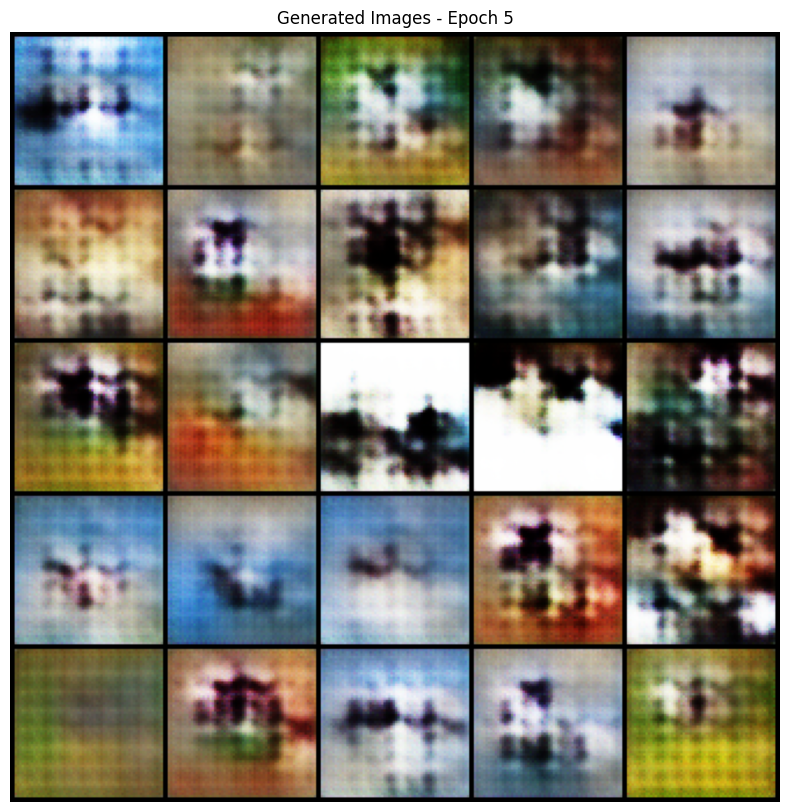

Epoch 5 completed!
Average D Loss: 0.5198
Average G Loss: 1.9047
Epoch [6/50] Batch [0/125] Loss_D: 0.4838 Loss_G: 1.7278
Epoch [6/50] Batch [100/125] Loss_D: 0.4462 Loss_G: 1.8961
Epoch 6 completed!
Average D Loss: 0.5143
Average G Loss: 1.9310
Epoch [7/50] Batch [0/125] Loss_D: 0.4714 Loss_G: 2.1642
Epoch [7/50] Batch [100/125] Loss_D: 0.3970 Loss_G: 1.4910
Epoch 7 completed!
Average D Loss: 0.5138
Average G Loss: 1.9077
Epoch [8/50] Batch [0/125] Loss_D: 0.6574 Loss_G: 1.0014
Epoch [8/50] Batch [100/125] Loss_D: 0.4547 Loss_G: 1.4406
Epoch 8 completed!
Average D Loss: 0.5189
Average G Loss: 1.8434
Epoch [9/50] Batch [0/125] Loss_D: 0.4328 Loss_G: 1.5749
Epoch [9/50] Batch [100/125] Loss_D: 0.5122 Loss_G: 1.1081
Epoch 9 completed!
Average D Loss: 0.5125
Average G Loss: 1.9532
Epoch [10/50] Batch [0/125] Loss_D: 0.5073 Loss_G: 2.1893
Epoch [10/50] Batch [100/125] Loss_D: 0.6028 Loss_G: 1.0281


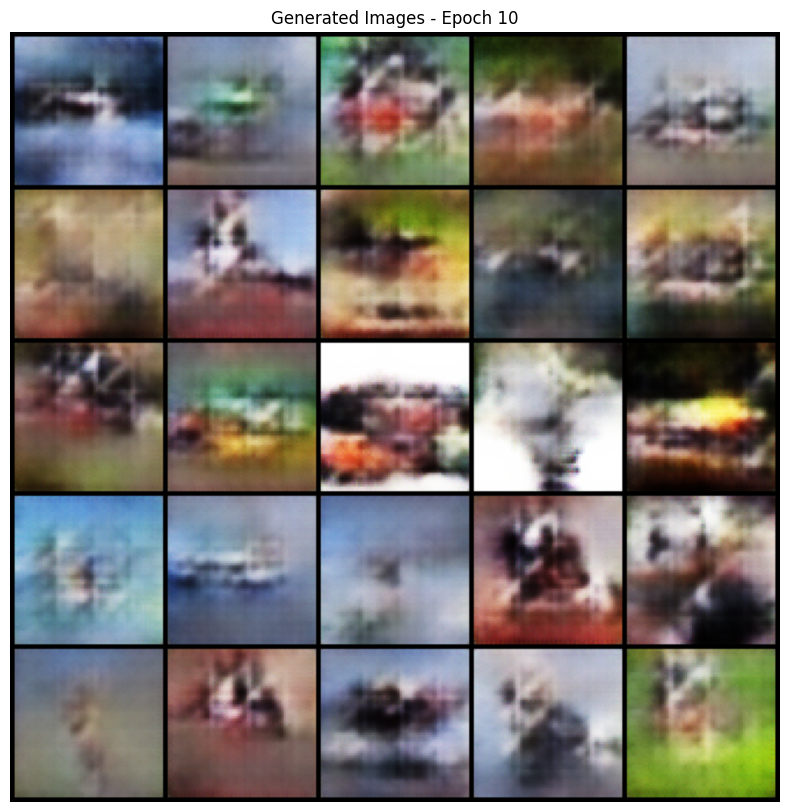

Epoch 10 completed!
Average D Loss: 0.5073
Average G Loss: 1.8514
Epoch [11/50] Batch [0/125] Loss_D: 0.4347 Loss_G: 1.6663
Epoch [11/50] Batch [100/125] Loss_D: 0.6160 Loss_G: 1.3563
Epoch 11 completed!
Average D Loss: 0.4989
Average G Loss: 1.9167
Epoch [12/50] Batch [0/125] Loss_D: 0.4113 Loss_G: 2.2145
Epoch [12/50] Batch [100/125] Loss_D: 0.4948 Loss_G: 1.3349
Epoch 12 completed!
Average D Loss: 0.5064
Average G Loss: 1.9145
Epoch [13/50] Batch [0/125] Loss_D: 0.4273 Loss_G: 1.7546
Epoch [13/50] Batch [100/125] Loss_D: 0.5134 Loss_G: 1.4984
Epoch 13 completed!
Average D Loss: 0.5074
Average G Loss: 1.9143
Epoch [14/50] Batch [0/125] Loss_D: 0.6837 Loss_G: 2.9136
Epoch [14/50] Batch [100/125] Loss_D: 0.3996 Loss_G: 2.0187
Epoch 14 completed!
Average D Loss: 0.4925
Average G Loss: 1.9368
Epoch [15/50] Batch [0/125] Loss_D: 0.6770 Loss_G: 1.5801
Epoch [15/50] Batch [100/125] Loss_D: 0.3761 Loss_G: 1.9876


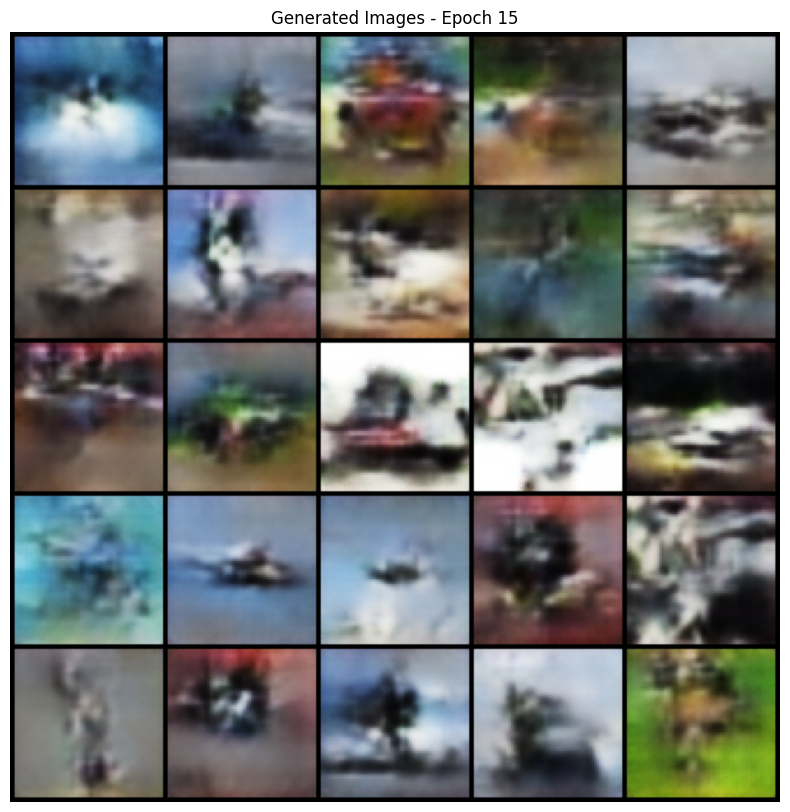

Epoch 15 completed!
Average D Loss: 0.4848
Average G Loss: 1.9411
Epoch [16/50] Batch [0/125] Loss_D: 0.3924 Loss_G: 1.5555
Epoch [16/50] Batch [100/125] Loss_D: 0.3990 Loss_G: 2.1419
Epoch 16 completed!
Average D Loss: 0.4715
Average G Loss: 1.9549
Epoch [17/50] Batch [0/125] Loss_D: 0.3759 Loss_G: 1.7941
Epoch [17/50] Batch [100/125] Loss_D: 0.4158 Loss_G: 1.9001
Epoch 17 completed!
Average D Loss: 0.4853
Average G Loss: 1.9831
Epoch [18/50] Batch [0/125] Loss_D: 0.3733 Loss_G: 2.1405
Epoch [18/50] Batch [100/125] Loss_D: 0.5021 Loss_G: 2.7036
Epoch 18 completed!
Average D Loss: 0.4437
Average G Loss: 2.0550
Epoch [19/50] Batch [0/125] Loss_D: 0.4594 Loss_G: 3.5989
Epoch [19/50] Batch [100/125] Loss_D: 0.4258 Loss_G: 1.9350
Epoch 19 completed!
Average D Loss: 0.4845
Average G Loss: 1.9978
Epoch [20/50] Batch [0/125] Loss_D: 0.7243 Loss_G: 1.7941
Epoch [20/50] Batch [100/125] Loss_D: 0.6047 Loss_G: 3.2173


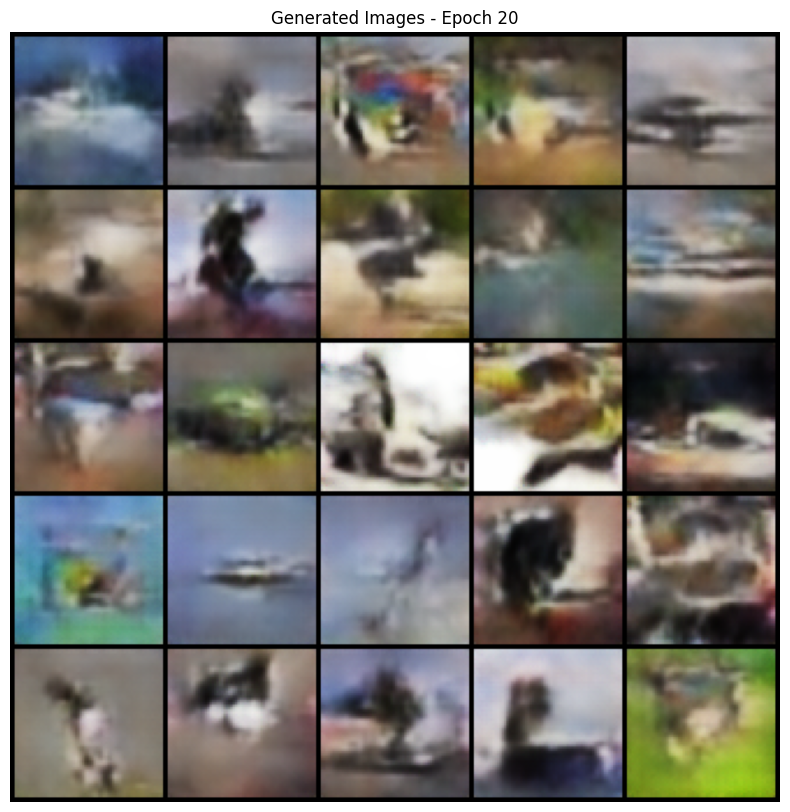

Epoch 20 completed!
Average D Loss: 0.4464
Average G Loss: 2.0213
Epoch [21/50] Batch [0/125] Loss_D: 0.3857 Loss_G: 2.9034
Epoch [21/50] Batch [100/125] Loss_D: 0.4981 Loss_G: 2.6616
Epoch 21 completed!
Average D Loss: 0.4586
Average G Loss: 2.0227
Epoch [22/50] Batch [0/125] Loss_D: 0.3674 Loss_G: 1.8826
Epoch [22/50] Batch [100/125] Loss_D: 0.3826 Loss_G: 1.9393
Epoch 22 completed!
Average D Loss: 0.4689
Average G Loss: 2.0485
Epoch [23/50] Batch [0/125] Loss_D: 0.3623 Loss_G: 1.6185
Epoch [23/50] Batch [100/125] Loss_D: 0.5777 Loss_G: 3.3908
Epoch 23 completed!
Average D Loss: 0.4219
Average G Loss: 2.1101
Epoch [24/50] Batch [0/125] Loss_D: 0.4779 Loss_G: 1.8445
Epoch [24/50] Batch [100/125] Loss_D: 0.3449 Loss_G: 1.7392
Epoch 24 completed!
Average D Loss: 0.4383
Average G Loss: 2.1388
Epoch [25/50] Batch [0/125] Loss_D: 0.4994 Loss_G: 1.1739
Epoch [25/50] Batch [100/125] Loss_D: 0.7447 Loss_G: 1.1405


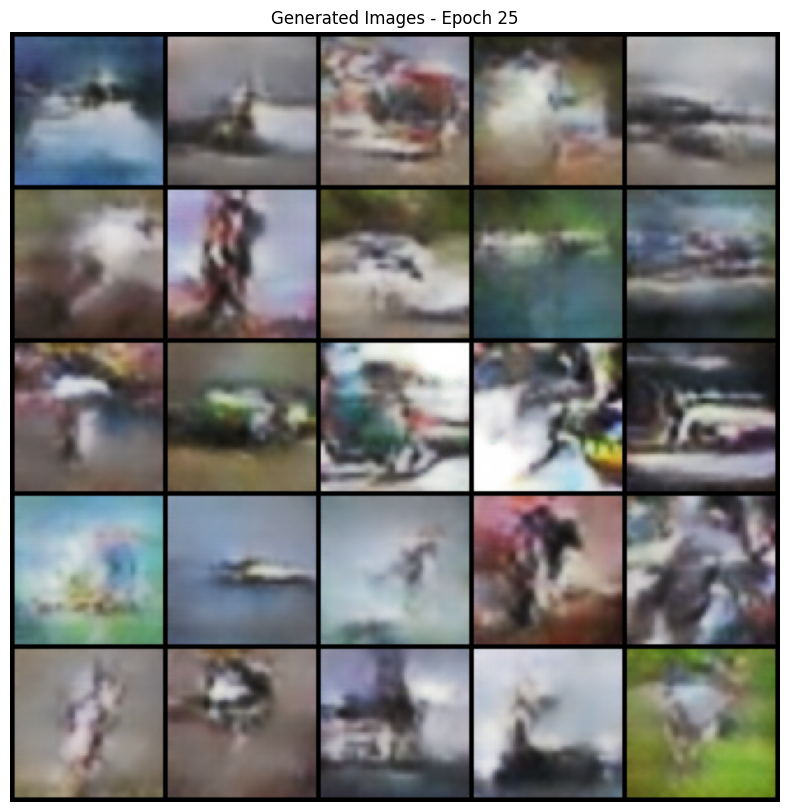

Epoch 25 completed!
Average D Loss: 0.4441
Average G Loss: 2.0650
Epoch [26/50] Batch [0/125] Loss_D: 0.4167 Loss_G: 1.7865
Epoch [26/50] Batch [100/125] Loss_D: 0.5171 Loss_G: 2.0782
Epoch 26 completed!
Average D Loss: 0.4267
Average G Loss: 2.1670
Epoch [27/50] Batch [0/125] Loss_D: 0.3672 Loss_G: 2.1872
Epoch [27/50] Batch [100/125] Loss_D: 1.2006 Loss_G: 1.4277
Epoch 27 completed!
Average D Loss: 0.4200
Average G Loss: 2.1058
Epoch [28/50] Batch [0/125] Loss_D: 0.3659 Loss_G: 1.9965
Epoch [28/50] Batch [100/125] Loss_D: 0.5564 Loss_G: 1.3880
Epoch 28 completed!
Average D Loss: 0.4064
Average G Loss: 2.1452
Epoch [29/50] Batch [0/125] Loss_D: 0.3381 Loss_G: 1.8619
Epoch [29/50] Batch [100/125] Loss_D: 0.3392 Loss_G: 2.1572
Epoch 29 completed!
Average D Loss: 0.4355
Average G Loss: 2.1026
Epoch [30/50] Batch [0/125] Loss_D: 0.3850 Loss_G: 1.8944
Epoch [30/50] Batch [100/125] Loss_D: 0.3812 Loss_G: 2.4767


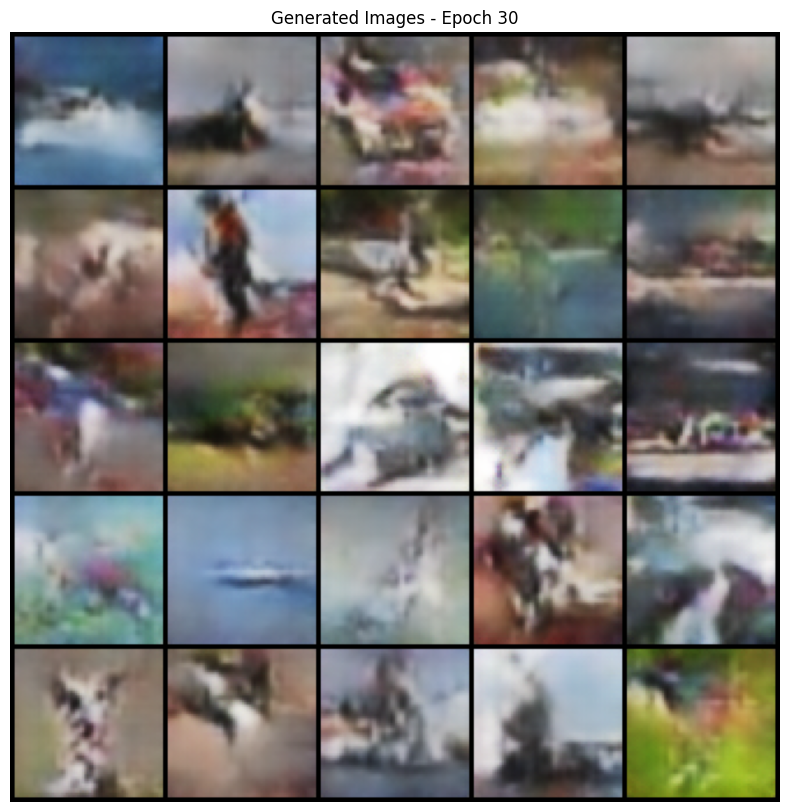

Epoch 30 completed!
Average D Loss: 0.4212
Average G Loss: 2.1032
Epoch [31/50] Batch [0/125] Loss_D: 0.3720 Loss_G: 2.3677
Epoch [31/50] Batch [100/125] Loss_D: 0.3380 Loss_G: 1.9320
Epoch 31 completed!
Average D Loss: 0.4184
Average G Loss: 2.1079
Epoch [32/50] Batch [0/125] Loss_D: 0.3521 Loss_G: 1.9514
Epoch [32/50] Batch [100/125] Loss_D: 0.4301 Loss_G: 2.0394
Epoch 32 completed!
Average D Loss: 0.4380
Average G Loss: 2.1103
Epoch [33/50] Batch [0/125] Loss_D: 0.3740 Loss_G: 2.2503
Epoch [33/50] Batch [100/125] Loss_D: 0.3562 Loss_G: 2.0779
Epoch 33 completed!
Average D Loss: 0.3987
Average G Loss: 2.1027
Epoch [34/50] Batch [0/125] Loss_D: 0.4049 Loss_G: 2.8560
Epoch [34/50] Batch [100/125] Loss_D: 0.3380 Loss_G: 2.0685
Epoch 34 completed!
Average D Loss: 0.4084
Average G Loss: 2.0806
Epoch [35/50] Batch [0/125] Loss_D: 0.5763 Loss_G: 3.9314
Epoch [35/50] Batch [100/125] Loss_D: 0.3409 Loss_G: 2.1431


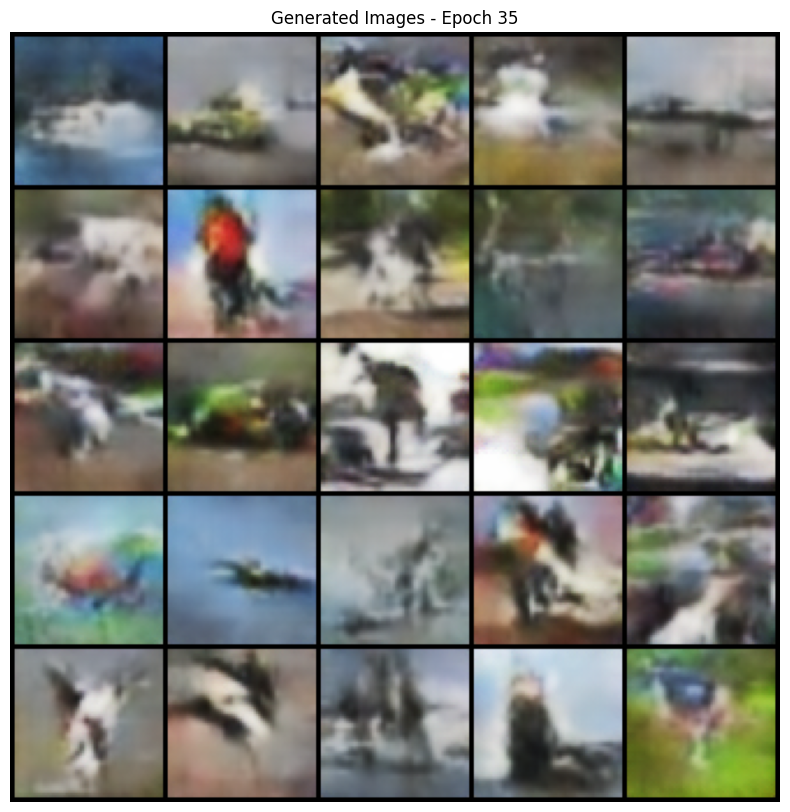

Epoch 35 completed!
Average D Loss: 0.4224
Average G Loss: 2.0898
Epoch [36/50] Batch [0/125] Loss_D: 0.3496 Loss_G: 1.8860
Epoch [36/50] Batch [100/125] Loss_D: 0.3793 Loss_G: 2.5411
Epoch 36 completed!
Average D Loss: 0.4254
Average G Loss: 2.0641
Epoch [37/50] Batch [0/125] Loss_D: 0.4256 Loss_G: 1.9052
Epoch [37/50] Batch [100/125] Loss_D: 0.3700 Loss_G: 2.1890
Epoch 37 completed!
Average D Loss: 0.4189
Average G Loss: 2.0757
Epoch [38/50] Batch [0/125] Loss_D: 0.4528 Loss_G: 1.8241
Epoch [38/50] Batch [100/125] Loss_D: 0.3506 Loss_G: 1.8089
Epoch 38 completed!
Average D Loss: 0.4046
Average G Loss: 2.1408
Epoch [39/50] Batch [0/125] Loss_D: 0.4279 Loss_G: 1.9598
Epoch [39/50] Batch [100/125] Loss_D: 0.3432 Loss_G: 1.7713
Epoch 39 completed!
Average D Loss: 0.4211
Average G Loss: 2.0390
Epoch [40/50] Batch [0/125] Loss_D: 0.3698 Loss_G: 2.1632
Epoch [40/50] Batch [100/125] Loss_D: 0.3858 Loss_G: 2.3761


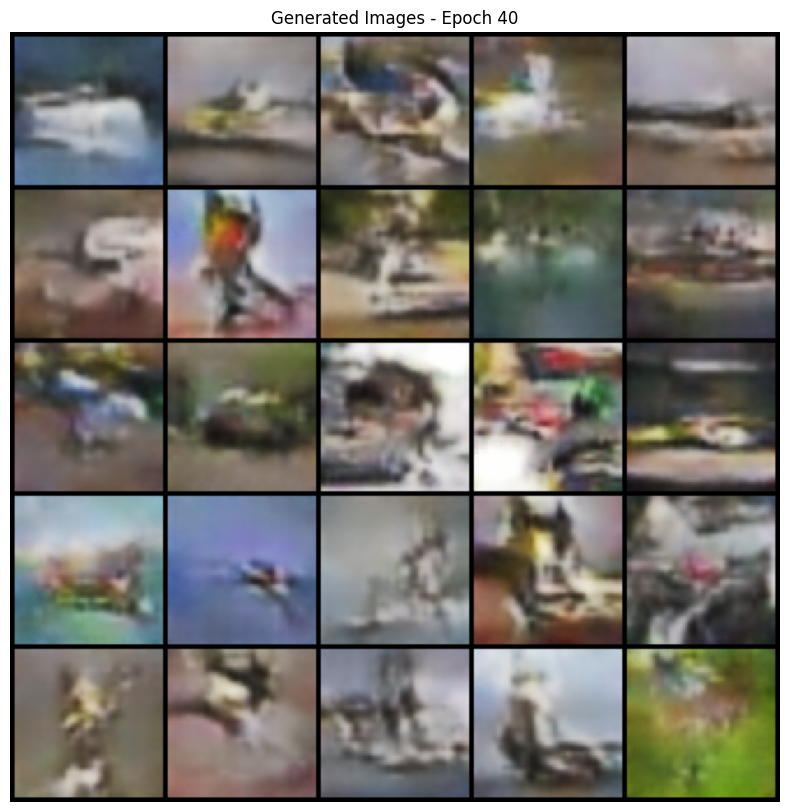

Epoch 40 completed!
Average D Loss: 0.4319
Average G Loss: 2.0610
Epoch [41/50] Batch [0/125] Loss_D: 0.4482 Loss_G: 1.3231
Epoch [41/50] Batch [100/125] Loss_D: 0.3537 Loss_G: 2.2393
Epoch 41 completed!
Average D Loss: 0.4056
Average G Loss: 2.0860
Epoch [42/50] Batch [0/125] Loss_D: 0.3384 Loss_G: 2.1220
Epoch [42/50] Batch [100/125] Loss_D: 0.3394 Loss_G: 1.9128
Epoch 42 completed!
Average D Loss: 0.3977
Average G Loss: 2.1282
Epoch [43/50] Batch [0/125] Loss_D: 0.5080 Loss_G: 1.3867
Epoch [43/50] Batch [100/125] Loss_D: 0.4050 Loss_G: 1.5582
Epoch 43 completed!
Average D Loss: 0.3930
Average G Loss: 2.1117
Epoch [44/50] Batch [0/125] Loss_D: 0.4265 Loss_G: 3.0361
Epoch [44/50] Batch [100/125] Loss_D: 0.3414 Loss_G: 1.9042
Epoch 44 completed!
Average D Loss: 0.3941
Average G Loss: 2.1116
Epoch [45/50] Batch [0/125] Loss_D: 0.3418 Loss_G: 1.9413
Epoch [45/50] Batch [100/125] Loss_D: 0.3978 Loss_G: 2.7266


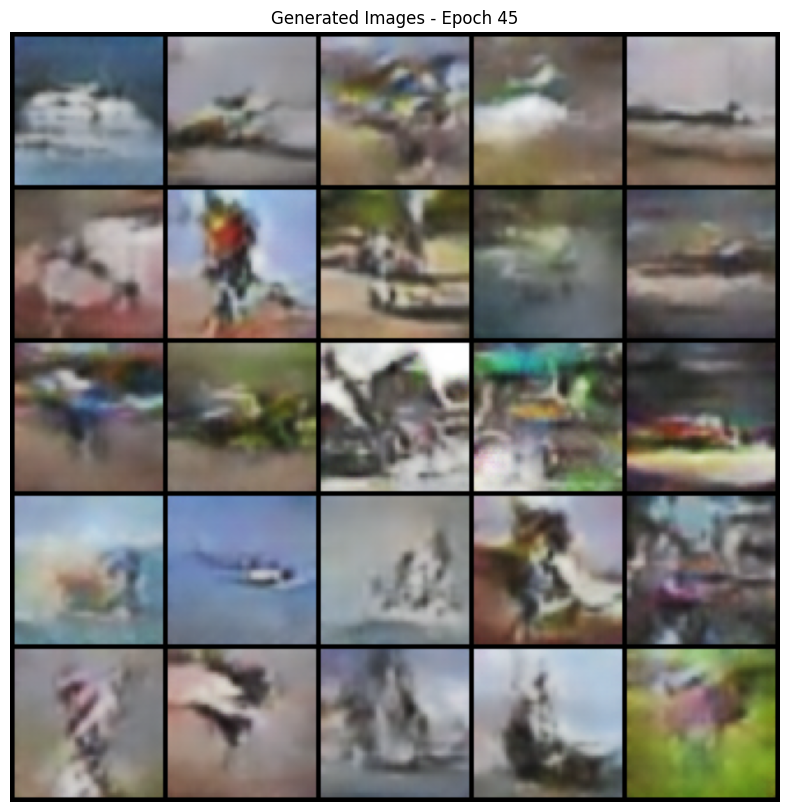

Epoch 45 completed!
Average D Loss: 0.4342
Average G Loss: 2.0744
Epoch [46/50] Batch [0/125] Loss_D: 0.3641 Loss_G: 2.6197
Epoch [46/50] Batch [100/125] Loss_D: 0.3612 Loss_G: 2.1457
Epoch 46 completed!
Average D Loss: 0.4083
Average G Loss: 2.1086
Epoch [47/50] Batch [0/125] Loss_D: 0.4488 Loss_G: 1.6828
Epoch [47/50] Batch [100/125] Loss_D: 0.5531 Loss_G: 1.2836
Epoch 47 completed!
Average D Loss: 0.3880
Average G Loss: 2.0539
Epoch [48/50] Batch [0/125] Loss_D: 0.4415 Loss_G: 3.2181
Epoch [48/50] Batch [100/125] Loss_D: 0.3945 Loss_G: 2.7133
Epoch 48 completed!
Average D Loss: 0.4398
Average G Loss: 2.0426
Epoch [49/50] Batch [0/125] Loss_D: 0.3479 Loss_G: 1.7060
Epoch [49/50] Batch [100/125] Loss_D: 0.3776 Loss_G: 2.2524
Epoch 49 completed!
Average D Loss: 0.4144
Average G Loss: 2.0715
Epoch [50/50] Batch [0/125] Loss_D: 0.3319 Loss_G: 2.1442
Epoch [50/50] Batch [100/125] Loss_D: 0.3889 Loss_G: 2.3237


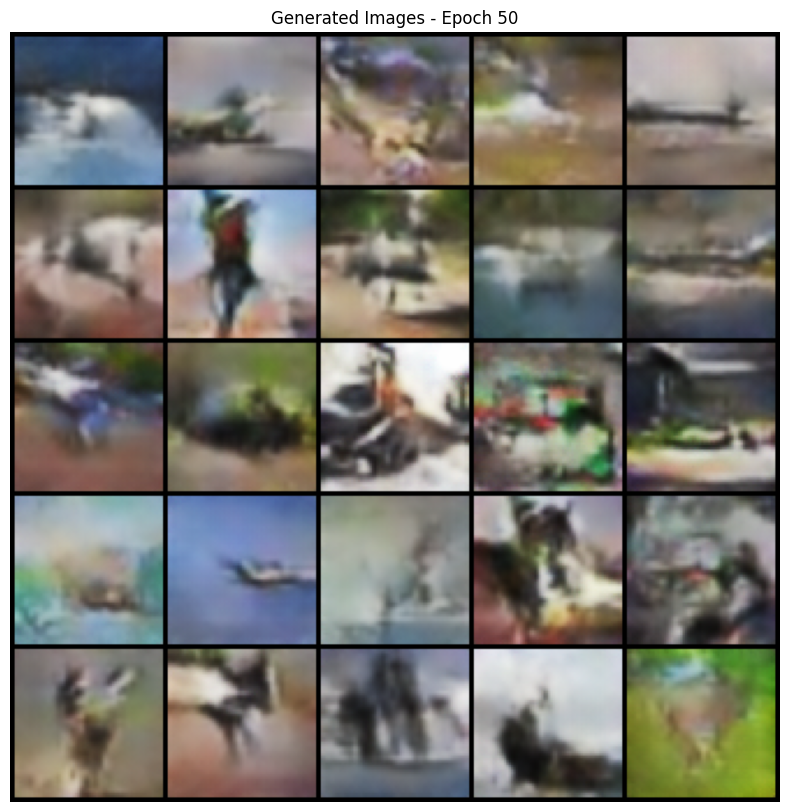

Epoch 50 completed!
Average D Loss: 0.4022
Average G Loss: 2.1030
Training completed!


In [16]:
# Step 13: Train the DCGAN
G_losses, D_losses = train_gan(
    epochs=num_epochs,
    feature_extractor=feature_extractor,
    generator=generator,
    discriminator=discriminator,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    print_every=100
)

print("Training completed!")

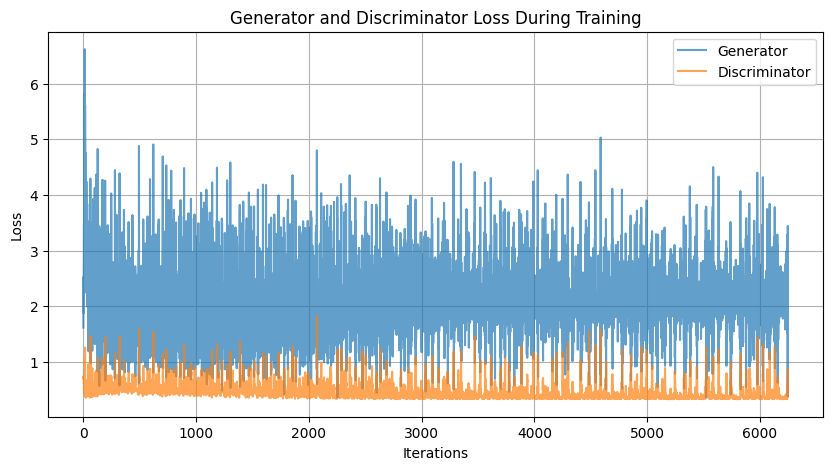

In [17]:
# Step 14: Plot Training Losses
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="Generator", alpha=0.7)
plt.plot(D_losses, label="Discriminator", alpha=0.7)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.savefig('training_losses.png')
plt.show()


Generating final samples...


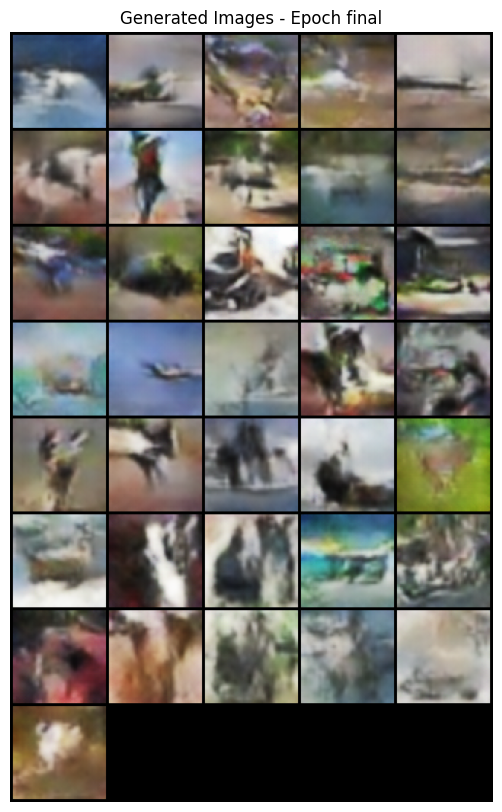

In [18]:
# Step 15: Generate Final Samples
print("\nGenerating final samples...")
visualize_generated_images(generator, feature_extractor, "final", n_samples=36)

In [19]:
# Step 16: Save Models
def save_models(generator, discriminator, feature_extractor):
    torch.save({
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'generator_config': {'latent_dim': latent_dim, 'feature_dim': feature_dim}
    }, 'dcgan_models.pth')
    
    print("Models saved successfully!")

save_models(generator, discriminator, feature_extractor)

Models saved successfully!


In [20]:
# Step 17: Evaluation Function
def evaluate_generator(generator, feature_extractor, val_loader, n_samples=100):
    """Evaluate generator performance"""
    generator.eval()
    feature_extractor.eval()
    
    all_features = []
    
    with torch.no_grad():
        for i in range(n_samples // batch_size + 1):
            # Get real images
            real_images, _ = next(iter(val_loader))
            real_images = real_images[:batch_size].to(device)
            
            # Extract features
            features = feature_extractor(real_images)
            
            # Generate fake images
            noise = generate_noise(features.size(0), latent_dim)
            fake_images = generator(noise, features)
            
            # Extract features from generated images
            fake_features = feature_extractor(fake_images)
            all_features.append(fake_features.cpu().numpy())
    
    # Calculate statistics
    all_features = np.concatenate(all_features, axis=0)[:n_samples]
    mean_features = np.mean(all_features, axis=0)
    std_features = np.std(all_features, axis=0)
    
    print(f"\nGenerator Evaluation (n={n_samples}):")
    print(f"Mean feature magnitude: {np.mean(np.abs(mean_features)):.4f}")
    print(f"Feature std: {np.mean(std_features):.4f}")
    
    generator.train()

# Run evaluation
evaluate_generator(generator, feature_extractor, val_loader, n_samples=200)


Generator Evaluation (n=200):
Mean feature magnitude: 0.6029
Feature std: 0.7569



Creating latent space interpolation...


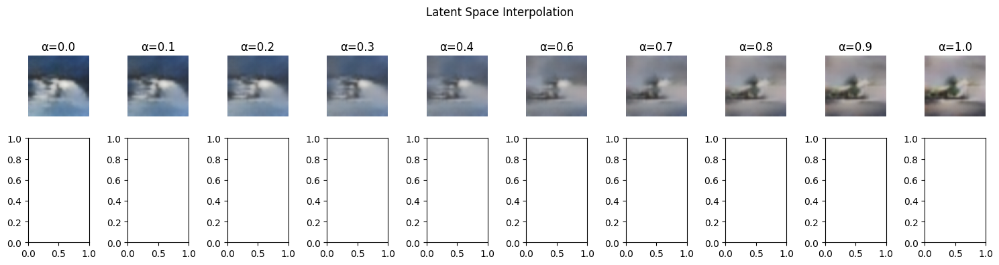


DCGAN with GoogleNet Feature Extraction Complete!


In [21]:
# Step 18: Create Interpolation Animation (Bonus)
def interpolate_latent_space(generator, feature_extractor):
    """Create interpolation between two points in latent space"""
    generator.eval()
    
    # Get features from two real images
    real_images, _ = next(iter(val_loader))
    img1 = real_images[0:1].to(device)
    img2 = real_images[1:2].to(device)
    
    with torch.no_grad():
        features1 = feature_extractor(img1)
        features2 = feature_extractor(img2)
        
        # Create interpolation steps
        n_steps = 10
        fig, axes = plt.subplots(2, n_steps, figsize=(15, 4))
        
        for i in range(n_steps):
            alpha = i / (n_steps - 1)
            
            # Interpolate features
            features = features1 * (1 - alpha) + features2 * alpha
            
            # Generate images
            noise1 = generate_noise(1, latent_dim)
            noise2 = generate_noise(1, latent_dim)
            noise = noise1 * (1 - alpha) + noise2 * alpha
            
            generated = generator(noise, features)
            generated = generated * 0.5 + 0.5  # Denormalize
            
            # Plot
            axes[0, i].imshow(generated[0].cpu().permute(1, 2, 0).numpy())
            axes[0, i].axis('off')
            axes[0, i].set_title(f'α={alpha:.1f}')
        
        plt.suptitle('Latent Space Interpolation')
        plt.tight_layout()
        plt.savefig('latent_interpolation.png')
        plt.show()
    
    generator.train()

print("\nCreating latent space interpolation...")
interpolate_latent_space(generator, feature_extractor)

print("\n" + "="*50)
print("DCGAN with GoogleNet Feature Extraction Complete!")
print("="*50)

# **Simple & Easy Explanation of DCGAN Concepts**

## **1. Introduction to GANs**
**What are GANs?**
GANs (Generative Adversarial Networks) are like an **art forger vs art expert game**:
- **Generator** = Art forger trying to create fake paintings
- **Discriminator** = Art expert trying to spot fakes
- They compete until fakes look 100% real

**Simple Analogy**: 
Imagine teaching someone to draw by having two people: one draws, the other critiques. The critic gets better at spotting mistakes, so the artist has to improve. This cycle continues until the drawings look perfect.

## **2. Schematic GAN Implementation**
**The Basic Setup**:
```
Step 1: Generator takes random noise → Creates fake image
Step 2: Discriminator sees both real & fake images
Step 3: Discriminator guesses which is real/fake
Step 4: Both learn from mistakes
Step 5: Repeat thousands of times
```

**Visual Flow**:
```
Random Noise → [Generator] → Fake Image
                       ↓
Real Image → [Discriminator] → Real or Fake? (0 or 1)
```

## **3. Bag of Tricks (Making GANs Work)**
**Common Problems & Solutions**:

1. **Training Instability** (GANs often crash)
   - **Fix**: Use Adam optimizer with special settings
   - **Fix**: Add batch normalization layers

2. **Mode Collapse** (Generator makes same image repeatedly)
   - **Fix**: Add more randomness in training
   - **Fix**: Use feature matching

3. **Blurry Images**
   - **Fix**: Use proper upsampling techniques
   - **Fix**: Add skip connections

4. **Discriminator Too Strong** (Generator can't learn)
   - **Fix**: Sometimes give wrong labels to confuse discriminator
   - **Fix**: Reduce discriminator's learning rate

## **4. The Generator (The Artist)**
**What it does**: Creates images from scratch

**How it works**:
1. Takes **random numbers** (like lottery numbers)
2. Gradually builds up details:
   - Starts with basic shapes (4×4 pixels)
   - Adds colors and textures (8×8)
   - Forms recognizable objects (16×16)
   - Creates final detailed image (64×64)

**Key Features**:
- Uses **transposed convolution** (smart upscaling)
- Has **batch normalization** (stabilizes training)
- Outputs images in **-1 to 1** range (matches normalized inputs)

## **5. The Discriminator (The Judge)**
**What it does**: Spots fake images

**How it works**:
1. Looks at an image (real or fake)
2. Breaks it down step-by-step:
   - Examines full image (64×64)
   - Focuses on key areas (32×32)
   - Studies patterns (16×16)
   - Analyzes details (8×8)
   - Makes final decision (4×4)
3. Outputs probability (0 = fake, 1 = real)

**Special Features**:
- Uses **LeakyReLU** (never completely turns off)
- Gets progressively more detailed in analysis
- Considers both **visual** and **semantic** features

## **6. The Adversarial Network (The Competition)**
**The Training Game**:

**Round 1: Train Discriminator**
- Show real images → Label: "REAL" (1)
- Show fake images → Label: "FAKE" (0)
- Update discriminator to be better at telling difference

**Round 2: Train Generator**
- Create new fake images
- Try to trick discriminator into calling them "REAL"
- Update generator to make better fakes

**The Balance**:
- If discriminator is **too good**: Generator can't learn
- If generator is **too good**: Discriminator can't improve
- **Goal**: Both improve together at similar pace

## **7. How to Train Your DCGAN**
**Step-by-Step Training Process**:

### **Preparation Phase**:
1. **Collect dataset** (real images)
2. **Preprocess images** (resize, normalize)
3. **Set parameters** (learning rate, batch size)

### **Training Phase**:
```
For each training batch:
  1. Train Discriminator:
     - Load real images → Mark as REAL
     - Generate fake images → Mark as FAKE
     - Update discriminator weights
  
  2. Train Generator:
     - Generate new fake images
     - Try to fool discriminator
     - Update generator weights
  
  3. Check Progress:
     - Save sample generated images
     - Monitor loss values
```

### **Monitoring Progress**:
**Epoch 1-10**: Random colors and blobs  
**Epoch 11-30**: Basic shapes and outlines  
**Epoch 31-50**: Recognizable objects  
**Epoch 51+**: Detailed, realistic images

### **Common Training Signs**:
✅ **Good Signs**:
- Losses oscillate (go up and down)
- Images get clearer over time
- Variety in generated images

❌ **Bad Signs**:
- One loss goes to zero (unbalanced training)
- Same image repeated (mode collapse)
- Images stay blurry (needs architecture change)

### **Practical Tips**:
1. **Start small**: 64×64 images before trying larger
2. **Be patient**: GANs need time to stabilize
3. **Save regularly**: Keep checkpoints every few epochs
4. **Visualize often**: Look at generated images daily
5. **Adjust carefully**: Change one parameter at a time

### **When to Stop Training**:
- Generated images look realistic
- Losses have stabilized (not changing much)
- No improvement for several epochs
- Reached maximum training time

---

## **Real-World Analogy**
**Think of it like counterfeit money training**:
- **Generator** = Counterfeit printer learning to print money
- **Discriminator** = Bank teller learning to spot fakes
- **Training** = Each day, printer makes better fakes, teller gets better at spotting them
- **End Result** = Fake money that even experts can't distinguish from real